<a href="https://colab.research.google.com/github/ajcoder13/IntradayTrading/blob/main/intradayTrading.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# ================================================
# 📈 NIFTY100 RELATIVE MOMENTUM + VOLUME STRATEGY
# ================================================
import os
import zipfile
import pandas as pd
import numpy as np
import warnings


warnings.filterwarnings('ignore')


# === CONFIGURATION ===
CSV_DIR = "."  # folder with *_15minute.csv files
ZIP_NAME = "trimmed_csvs.zip"
SECTOR_MAP_FILE = "sector_map.csv"
OUTPUT_DIR = "output"
LOOKBACK_DAYS = 90
VOLATILITY_WINDOW = 12
RSI_PERIOD = 14
TOP_N = 16


# === WEIGHTS ===
WEIGHTS = {
    'momentum': 0.25,
    'rel_momentum': 0.25,
    'vol_momentum': 0.2,
    'volatility': 0.1,
    'liquidity': 0.1,
    'rsi': 0.1
}


# === SECTOR ALLOCATION RULES ===
SECTOR_ALLOCATION = {
    'Finance': 4,
    'Technology': 1,
    'Consumer Goods': 1,
    'Energy': 1,
    'Healthcare': 1,
    'Others': 2
}




# -----------------------------
# STEP 1: CREATE ZIP & SECTOR MAP
# -----------------------------
def prepare_data():
    csv_files = [f for f in os.listdir(CSV_DIR) if f.lower().endswith(".csv")]
    if not csv_files:
        raise FileNotFoundError("No CSV files found in the folder!")


    with zipfile.ZipFile(ZIP_NAME, "w", zipfile.ZIP_DEFLATED) as zf:
        for file in csv_files:
            zf.write(os.path.join(CSV_DIR, file), arcname=file)
            print(f"Added {file} ✅")


    print(f"\n[INFO] Created ZIP archive: {ZIP_NAME} ({len(csv_files)} files)\n")


    # --- Sector map (simplified auto map) ---
    sector_data = [
        ("ABB", "Industrials"), ("ADANIENSOL",
                                 "Energy"), ("ADANIENT", "Industrials"),
        ("ADANIGREEN", "Energy"), ("ADANIPORTS",
                                   "Industrials"), ("ADANIPOWER", "Energy"),
        ("AMBUJACEM", "Materials"), ("APOLLOHOSP",
                                     "Healthcare"), ("ASIANPAINT", "Consumer Goods"),
        ("AXISBANK", "Finance"), ("BAJAJ-AUTO",
                                  "Automobile"), ("BAJAJFINSV", "Finance"),
        ("BAJAJHFL", "Finance"), ("BAJAJHLDNG",
                                  "Finance"), ("BAJFINANCE", "Finance"),
        ("BANKBARODA", "Finance"), ("BEL", "Industrials"), ("BHARTIARTL", "Telecom"),
        ("BOSCHLTD", "Automobile"), ("BPCL",
                                     "Energy"), ("BRITANNIA", "Consumer Goods"),
        ("CANBK", "Finance"), ("CGPOWER", "Industrials"), ("CHOLAFIN", "Finance"),
        ("CIPLA", "Healthcare"), ("COALINDIA",
                                  "Energy"), ("DABUR", "Consumer Goods"),
        ("DIVISLAB", "Healthcare"), ("DLF",
                                     "Real Estate"), ("DMART", "Consumer Services"),
        ("DRREDDY", "Healthcare"), ("EICHERMOT",
                                    "Automobile"), ("ETERNAL", "Industrials"),
        ("GAIL", "Energy"), ("GODREJCP", "Consumer Goods"), ("GRASIM", "Materials"),
        ("HAL", "Industrials"), ("HAVELLS",
                                 "Consumer Goods"), ("HCLTECH", "Technology"),
        ("HDFCBANK", "Finance"), ("HDFCLIFE",
                                  "Finance"), ("HEROMOTOCO", "Automobile"),
        ("HINDALCO", "Materials"), ("HINDUNILVR",
                                    "Consumer Goods"), ("HYUNDAI", "Automobile"),
        ("ICICIBANK", "Finance"), ("ICICIGI",
                                   "Finance"), ("ICICIPRULI", "Finance"),
        ("INDHOTEL", "Consumer Services"), ("INDIGO", "Consumer Services"),
        ("INDUSINDBK", "Finance"), ("INFY",
                                    "Technology"), ("IOC", "Energy"), ("IRFC", "Finance"),
        ("ITC", "Consumer Goods"), ("JINDALSTEL",
                                    "Materials"), ("JIOFIN", "Finance"),
        ("JSWENERGY", "Energy"), ("JSWSTEEL",
                                  "Materials"), ("KOTAKBANK", "Finance"),
        ("LICI", "Finance"), ("LODHA", "Real Estate"), ("LTIM", "Technology"),
        ("LT", "Industrials"), ("MARUTI", "Automobile"), ("MM", "Automobile"),
        ("MOTHERSON", "Automobile"), ("NAUKRI",
                                      "Technology"), ("NESTLEIND", "Consumer Goods"),
        ("NTPC", "Energy"), ("ONGC", "Energy"), ("PFC",
                                                 "Finance"), ("PIDILITIND", "Materials"),
        ("PNB", "Finance"), ("POWERGRID", "Energy"), ("RECLTD", "Finance"),
        ("RELIANCE", "Energy"), ("SBILIFE", "Finance"), ("SBIN", "Finance"),
        ("SHREECEM", "Materials"), ("SHRIRAMFIN",
                                    "Finance"), ("SIEMENS", "Industrials"),
        ("SUNPHARMA", "Healthcare"), ("SWIGGY", "Consumer Services"),
        ("TATACONSUM", "Consumer Goods"), ("TATAMOTORS", "Automobile"),
        ("TATAPOWER", "Energy"), ("TATASTEEL", "Materials"), ("TCS", "Technology"),
        ("TECHM", "Technology"), ("TITAN",
                                  "Consumer Goods"), ("TORNTPHARM", "Healthcare"),
        ("TRENT", "Consumer Services"), ("TVSMOTOR",
                                         "Automobile"), ("ULTRACEMCO", "Materials"),
        ("UNITDSPR", "Consumer Goods"), ("VBL",
                                         "Consumer Goods"), ("VEDL", "Materials"),
        ("WIPRO", "Technology"), ("ZYDUSLIFE", "Healthcare")
    ]


    pd.DataFrame(sector_data, columns=["ticker", "sector"]).to_csv(
        SECTOR_MAP_FILE, index=False)
    print(f"[INFO] Saved sector map to: {SECTOR_MAP_FILE}\n")




# -----------------------------
# STEP 2: METRIC COMPUTATION
# -----------------------------
def read_csv_from_zip(zip_path):
    with zipfile.ZipFile(zip_path) as zf:
        for name in zf.namelist():
            if name.lower().endswith(".csv"):
                yield name.replace("_15minute.csv", "").upper(), pd.read_csv(zf.open(name))




def compute_rsi(close, period=14):
    delta = close.diff()
    gain = delta.clip(lower=0)
    loss = -delta.clip(upper=0)
    avg_gain = gain.ewm(alpha=1 / period, adjust=False).mean()
    avg_loss = loss.ewm(alpha=1 / period, adjust=False).mean()
    rs = avg_gain / (avg_loss + 1e-9)
    return 100 - (100 / (1 + rs))




def compute_metrics(df):
    m = {'momentum': np.nan, 'rel_momentum': np.nan, 'vol_momentum': np.nan,
         'volatility': np.nan, 'liquidity': np.nan, 'rsi': np.nan}
    try:
        close = pd.to_numeric(df['close'], errors='coerce')
        volume = pd.to_numeric(df['volume'], errors='coerce')
        close, volume = close.dropna(), volume.dropna()
        if len(close) < LOOKBACK_DAYS + 5:
            return m


        # Momentum (absolute & relative)
        returns = close.pct_change(LOOKBACK_DAYS)
        m['momentum'] = returns.iloc[-1]
        # relative to median return over last 90 days
        m['rel_momentum'] = returns.iloc[-1] - returns.median()


        # Volume momentum
        m['vol_momentum'] = volume.pct_change(LOOKBACK_DAYS).iloc[-1]


        # Volatility
        m['volatility'] = close.pct_change().rolling(VOLATILITY_WINDOW).std().iloc[-1] * np.sqrt(252)


        # Liquidity
        m['liquidity'] = (close * volume).tail(LOOKBACK_DAYS).mean()


        # RSI stability
        rsi_val = compute_rsi(close, RSI_PERIOD).iloc[-1]
        m['rsi'] = 1 - abs(rsi_val - 50) / 50


    except Exception:
        pass
    return m




def normalize(series):
    s = series.copy()
    if s.max() == s.min():
        return pd.Series(0.5, index=s.index)
    return (s - s.min()) / (s.max() - s.min())




# -----------------------------
# STEP 3: RANKING & OUTPUT
# -----------------------------
def main():
    prepare_data()
    os.makedirs(OUTPUT_DIR, exist_ok=True)


    sector_map = dict(pd.read_csv(SECTOR_MAP_FILE).values)
    rows = []


    for ticker, df in read_csv_from_zip(ZIP_NAME):
        if ticker not in sector_map:
            continue
        metrics = compute_metrics(df)
        if all(np.isnan(list(metrics.values()))):
            continue
        metrics['ticker'] = ticker
        metrics['sector'] = sector_map[ticker]
        rows.append(metrics)

    df = pd.DataFrame(rows)

    if df.empty:
        print("[!] No valid stocks found.")
        return


    # --- Normalization ---
    df['momentum'] = normalize(df['momentum'].fillna(0))
    df['rel_momentum'] = normalize(df['rel_momentum'].fillna(0))
    df['vol_momentum'] = normalize(df['vol_momentum'].fillna(0))
    df['volatility'] = 1 - normalize(df['volatility'].fillna(df['volatility'].median()))
    df['liquidity'] = normalize(np.log1p(df['liquidity'].fillna(1)))
    df['rsi'] = df['rsi'].fillna(0.5)


    # --- Weighted Score ---
    df['score'] = sum(df[k] * w for k, w in WEIGHTS.items())


    df.to_csv(f"{OUTPUT_DIR}/scored_universe.csv", index=False)
    print(f"[INFO] Saved scored universe to {OUTPUT_DIR}/scored_universe.csv")


    # --- Sector Allocation ---
    selected = []
    for sector, n in SECTOR_ALLOCATION.items():
        subset = df[df['sector'] == sector].sort_values("score", ascending=False).head(n)
        if not subset.empty:
            selected.append(subset)


    df_sel = pd.concat(selected).sort_values("score", ascending=False)


    # If < 10 stocks, fill from remaining
    if len(df_sel) < TOP_N:
        missing = TOP_N - len(df_sel)
        others = df[~df['ticker'].isin(df_sel['ticker'])].sort_values("score", ascending=False).head(missing)
        df_sel = pd.concat([df_sel, others]).sort_values("score", ascending=False)


    df_sel = df_sel.head(TOP_N)
    df_sel['rank'] = range(1, len(df_sel) + 1)


    df_sel.to_csv(f"{OUTPUT_DIR}/selected_top10.csv", index=False)
    print(f"[INFO] Saved Top {TOP_N} selections to {OUTPUT_DIR}/selected_top10.csv\n")


    print("===== FINAL SELECTION =====")
    for _, r in df_sel.iterrows():
        print(f"{r['rank']:2d}. {r['ticker']:<12} | {r['sector']:<15} | Score: {r['score']:.4f}")
    return df_sel




if __name__ == "__main__":
    main()



Added ZYDUSLIFE_15minute.csv ✅
Added AMBUJACEM_15minute.csv ✅
Added DLF_15minute.csv ✅
Added ADANIPOWER_15minute.csv ✅
Added NIFTY BANK_15minutedata.csv ✅
Added PFC_15minute.csv ✅
Added GAIL_15minute.csv ✅
Added EICHERMOT_15minute.csv ✅
Added ASIANPAINT_15minute.csv ✅
Added SBIN_15minute.csv ✅
Added UNITDSPR_15minute.csv ✅
Added SBILIFE_15minute.csv ✅
Added BEL_15minute.csv ✅
Added AXISBANK_15minute.csv ✅
Added SWIGGY_15minute.csv ✅
Added PNB_15minute.csv ✅
Added sector_map.csv ✅
Added JSWSTEEL_15minute.csv ✅
Added IRFC_15minute.csv ✅
Added VEDL_15minute.csv ✅
Added TVSMOTOR_15minute.csv ✅
Added CIPLA_15minute.csv ✅
Added COALINDIA_15minute.csv ✅
Added TRENT_15minute.csv ✅
Added KOTAKBANK_15minute.csv ✅
Added ETERNAL_15minute.csv ✅
Added BAJAJHLDNG_15minute.csv ✅
Added ADANIENT_15minute.csv ✅
Added BAJAJ-AUTO_15minute.csv ✅
Added HINDUNILVR_15minute.csv ✅
Added ADANIPORTS_15minute.csv ✅
Added BHARTIARTL_15minute.csv ✅
Added ULTRACEMCO_15minute.csv ✅
Added WIPRO_15minute.csv ✅
Added HIN

▶️ BOSCHLTD
▶️ VBL
▶️ DMART
▶️ LT
▶️ CIPLA
▶️ SHRIRAMFIN
▶️ ADANIPOWER
▶️ HYUNDAI
▶️ ASIANPAINT
▶️ JIOFIN
▶️ TORNTPHARM
▶️ GRASIM
▶️ HDFCBANK
▶️ SUNPHARMA
▶️ ICICIBANK
▶️ INFY

===== PERFORMANCE =====
Return%   : 31.14
Sharpe    : 4.15
Sortino   : 8.02
WinRate   : 53.28
Trades    : 6608.00
Volatility%: 6.99
MaxDrawdown%: 2.60


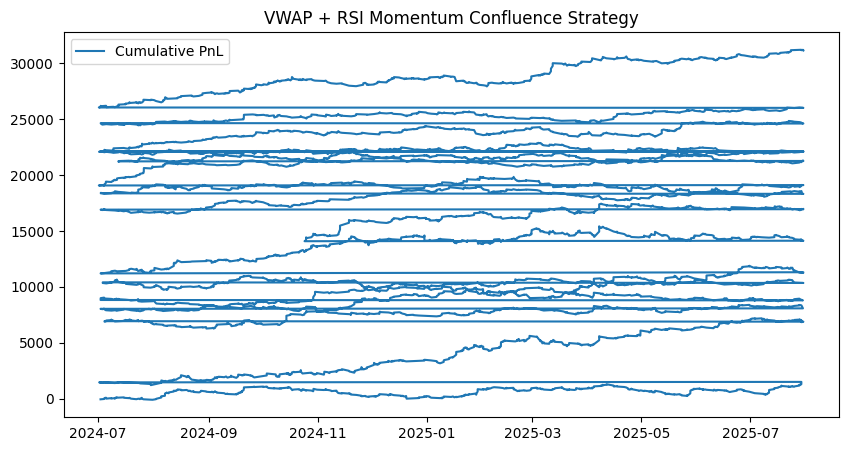

In [ ]:
# =========================================
# 📊 VWAP + RSI Momentum Confluence Intraday
# =========================================
import os, zipfile, glob, warnings
import pandas as pd, numpy as np
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")


# -------- CONFIG --------
ZIP_PATH = "trimmed_csvs.zip"
EXTRACT_DIR = "nifty100_csvs/"
CAPITAL = 100000
RSI_OVERSOLD = 28
RSI_OVERBOUGHT = 72
ATR_PERIOD = 14
VOLUME_PERIOD = 13
PARTIAL_GAIN = 0.005   # 0.5%
FULL_GAIN = 0.01       # 1%
MAX_LOSS = 0.005       # 0.3–0.5%
AVOID_START = "09:15"
AVOID_END = "09:25"
AVOID_CLOSE = "15:20"


# -------- UNZIP DATA --------
os.makedirs(EXTRACT_DIR, exist_ok=True)
with zipfile.ZipFile(ZIP_PATH, "r") as zf:
    zf.extractall(EXTRACT_DIR)


# -------- INDICATORS --------
def compute_rsi(df, period=14):
    delta = df["Close"].diff()
    gain = delta.clip(lower=0)
    loss = -delta.clip(upper=0)
    avg_gain = gain.ewm(alpha=1/period, adjust=False).mean()
    avg_loss = loss.ewm(alpha=1/period, adjust=False).mean()
    rs = avg_gain / (avg_loss + 1e-9)
    df["RSI"] = 100 - (100/(1+rs))
    return df


def compute_vwap(df):
    return (df["Close"]*df["Volume"]).cumsum() / df["Volume"].cumsum()


def compute_avg_volume(df, period=VOLUME_PERIOD):
    df["VolAvg"] = df["Volume"].rolling(period).mean()
    return df


# -------- PERFORMANCE METRICS --------
# -------- PERFORMANCE METRICS --------
def metrics(trades):
    if not trades:
        return {"Return%":0,"Sharpe":0,"Sortino":0,"WinRate":0,"Trades":0, "Volatility%":0, "MaxDrawdown%":0}
    tdf = pd.DataFrame(trades)
    daily = tdf.groupby(tdf["Exit"].dt.date)["PnL"].sum() / CAPITAL
    mean, std = daily.mean(), daily.std()
    neg_std = daily[daily<0].std()
    sharpe = (mean/std)*np.sqrt(252) if std>0 else 0
    sortino = (mean/neg_std)*np.sqrt(252) if neg_std>0 else 0
    winrate = (tdf["PnL"]>0).mean()*100
    total = tdf["PnL"].sum()/CAPITAL*100
    volatility = std * np.sqrt(252) * 100  # annualized % volatility


    # Max Drawdown
    cum_returns = (tdf["PnL"].cumsum() / CAPITAL)
    running_max = cum_returns.cummax()
    drawdown = running_max - cum_returns
    max_dd = drawdown.max() * 100  # %


    return {
        "Return%": total,
        "Sharpe": sharpe,
        "Sortino": sortino,
        "WinRate": winrate,
        "Trades": len(tdf),
        "Volatility%": volatility,
        "MaxDrawdown%": max_dd
    }




# -------- BACKTEST PER STOCK --------
def backtest(symbol, capital_each):
    fmatch = glob.glob(os.path.join(EXTRACT_DIR, f"{symbol}*.csv"))
    if not fmatch:
        print(f"❌ {symbol} missing"); return []
    df = pd.read_csv(fmatch[0])
    df.rename(columns=str.title, inplace=True)
    df["Date"] = pd.to_datetime(df["Date"])
    df.set_index("Date", inplace=True)
    df = df.between_time("09:15","15:30")


    df = compute_rsi(df)
    df["VWAP"] = compute_vwap(df)
    df = compute_avg_volume(df)


    trades=[]
    pos, entry_p, entry_t, sl = 0,0,None,0


    for i,row in df.iterrows():
        price, rsi, vwap, vol = row["Close"], row["RSI"], row["VWAP"], row["Volume"]
        vol_avg = row["VolAvg"] if not np.isnan(row["VolAvg"]) else 1


        # avoid opening/closing
        if (i.time() <= pd.to_datetime(AVOID_END).time()) or (i.time() >= pd.to_datetime(AVOID_CLOSE).time()):
            continue


        # LONG ENTRY
        if pos==0 and price>vwap and rsi>RSI_OVERSOLD and rsi<50 and vol>vol_avg:
            pos, entry_p, entry_t, sl = 1, price, i, price*(1-MAX_LOSS)


        # SHORT ENTRY
        elif pos==0 and price<vwap and rsi<RSI_OVERBOUGHT and rsi>50 and vol>vol_avg:
            pos, entry_p, entry_t, sl = -1, price, i, price*(1+MAX_LOSS)


        # EXIT
        elif pos!=0:
            change = (price-entry_p)/entry_p*(1 if pos==1 else -1)
            exit_cond = False
            # Partial exit
            if change>=PARTIAL_GAIN:
                pnl = capital_each*change
                trades.append({"Stock":symbol,"Entry":entry_t,"Exit":i,"PnL":pnl})
                # trail stop for remaining
                entry_p = price
                sl = price*(1-0.005) if pos==1 else price*(1+0.005)
            # Full exit
            if change>=FULL_GAIN or price<=sl if pos==1 else price>=sl or (pos==1 and rsi>70) or (pos==-1 and rsi<30):
                pnl = capital_each*change
                trades.append({"Stock":symbol,"Entry":entry_t,"Exit":i,"PnL":pnl})
                pos=0


    # force exit EOD
    if pos!=0:
        pnl = capital_each*((df["Close"].iloc[-1]-entry_p)/entry_p*(1 if pos==1 else -1))
        trades.append({"Stock":symbol,"Entry":entry_t,"Exit":df.index[-1],"PnL":pnl})
    return trades


# -------- RUN ON SELECTED STOCKS --------
df_sel = pd.read_csv("output/selected_top10.csv")  # always fresh
selected = df_sel["ticker"].tolist()
cap_each = CAPITAL / len(selected)
all_trades=[]
for s in selected:
    print(f"▶️ {s}")
    all_trades += backtest(s, cap_each)


# -------- PERFORMANCE --------
res = metrics(all_trades)
print("\n===== PERFORMANCE =====")
for k,v in res.items(): print(f"{k:10}: {v:.2f}")


# -------- CUMULATIVE PnL PLOT --------
if all_trades:
    tdf = pd.DataFrame(all_trades)
    tdf["CumPnL"] = tdf["PnL"].cumsum()
    plt.figure(figsize=(10,5))
    plt.plot(tdf["Exit"], tdf["CumPnL"], label="Cumulative PnL")
    plt.title("VWAP + RSI Momentum Confluence Strategy")
    plt.legend(); plt.show()
else:
    print("⚠️ No trades triggered.")

In [ ]:
# =========================================
# 📊 Plot Buy/Sell Signals for All Selected Stocks (Fixed)
# =========================================
import plotly.graph_objects as go
from plotly.subplots import make_subplots

for stock in selected:
    # --- Load CSV ---
    fmatch = glob.glob(os.path.join(EXTRACT_DIR, f"{stock}*.csv"))
    if not fmatch:
        print(f"❌ {stock} CSV not found")
        continue
    df = pd.read_csv(fmatch[0])
    df.rename(columns=str.title, inplace=True)
    df["Date"] = pd.to_datetime(df["Date"])

    # --- Compute RSI if missing ---
    if "RSI" not in df.columns:
        df = compute_rsi(df)

    # --- Reset index for Plotly ---
    df.reset_index(drop=True, inplace=True)
    df.rename(columns={"Date":"datetime","Open":"open","High":"high","Low":"low","Close":"close"}, inplace=True)

    # --- Prepare signals from all_trades ---
    df["signals"] = 0
    stock_trades = [t for t in all_trades if t["Stock"]==stock]

    datetime_array = df["datetime"].values
    for t in stock_trades:
        # Find nearest index for Entry
        entry_idx = df["datetime"].searchsorted(t["Entry"])
        if entry_idx >= len(df): entry_idx = len(df)-1
        # Find nearest index for Exit
        exit_idx = df["datetime"].searchsorted(t["Exit"])
        if exit_idx >= len(df): exit_idx = len(df)-1
        df.loc[entry_idx, "signals"] = 1   # Buy/Cover
        df.loc[exit_idx, "signals"] = -1   # Sell/Short

    # --- Plotly Figure ---
    fig = make_subplots(
        rows=2, cols=1, shared_xaxes=True,
        vertical_spacing=0.05,
        subplot_titles=(f"{stock} Price & Trades", "RSI Indicator"),
        row_heights=[0.7,0.3]
    )

    # Candlestick
    fig.add_trace(go.Candlestick(
        x=df['datetime'], open=df['open'], high=df['high'],
        low=df['low'], close=df['close'], name="Price"
    ), row=1, col=1)

    # Buy/Sell signals
    buy = df[df['signals']==1]
    sell = df[df['signals']==-1]
    fig.add_trace(go.Scatter(
        x=buy['datetime'], y=buy['open'], mode='markers',
        marker=dict(color='lime', symbol='triangle-up', size=8, line=dict(width=1, color='black')),
        name='Buy/Cover'
    ), row=1, col=1)
    fig.add_trace(go.Scatter(
        x=sell['datetime'], y=sell['open'], mode='markers',
        marker=dict(color='red', symbol='triangle-down', size=8, line=dict(width=1, color='black')),
        name='Sell/Short'
    ), row=1, col=1)

    # RSI panel
    fig.add_trace(go.Scatter(
        x=df['datetime'], y=df['RSI'], mode='lines', name='RSI',
        line=dict(color='cyan', width=1.5)
    ), row=2, col=1)
    fig.add_hline(y=RSI_OVERSOLD+7, line_dash="dash", line_color="lime", line_width=1, row=2, col=1)
    fig.add_hline(y=RSI_OVERBOUGHT-7, line_dash="dash", line_color="red", line_width=1, row=2, col=1)

    # Layout
    fig.update_layout(
        title=f"{stock} VWAP + RSI Strategy Signals",
        template="plotly_dark",
        height=700,
        xaxis_rangeslider_visible=False
    )
    fig.update_yaxes(title_text="Price (INR)", row=1, col=1)
    fig.update_yaxes(title_text="RSI", row=2, col=1)

    fig.show()




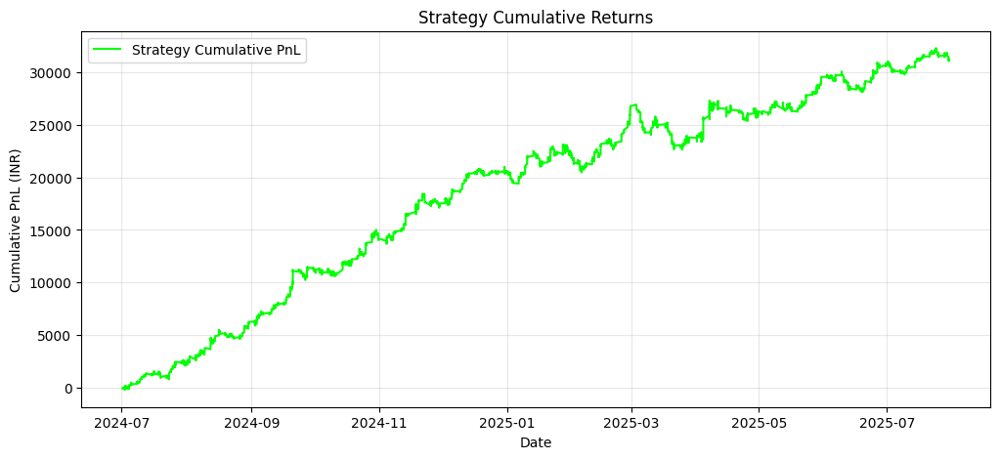

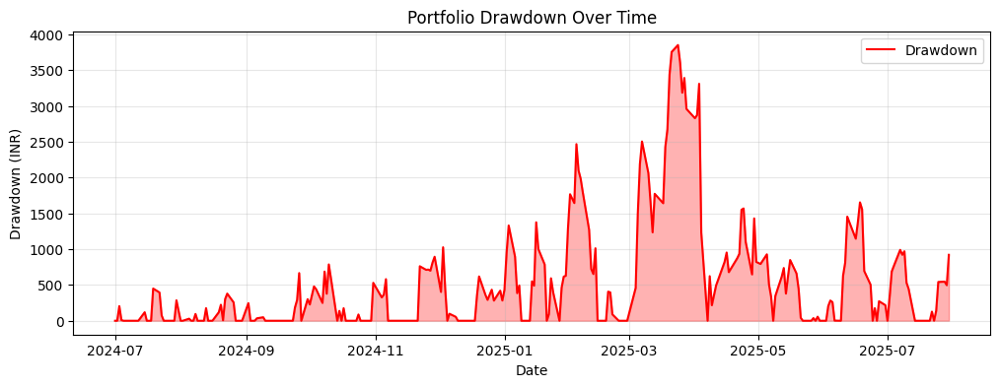

In [ ]:
# =========================================
# 📊 Strategy Insights & Benchmark Comparison
# =========================================
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# -------- CONFIG --------
#BENCHMARK_CSV = "benchmark.csv"  # Provide your benchmark CSV here
CAPITAL = 100000

# -------- PREPARE STRATEGY CUMULATIVE PnL --------
if all_trades:
    tdf = pd.DataFrame(all_trades)
    tdf.sort_values("Exit", inplace=True)
    tdf["CumPnL"] = tdf["PnL"].cumsum()

    # Daily PnL for drawdown calculation
    daily = tdf.groupby(tdf["Exit"].dt.date)["PnL"].sum()
    cum_daily = daily.cumsum()

    # Drawdown
    running_max = cum_daily.cummax()
    drawdown = running_max - cum_daily

    # -------- PLOT 1: CUMULATIVE RETURNS --------
    plt.figure(figsize=(12,5))
    plt.plot(tdf["Exit"], tdf["CumPnL"], color='lime', label="Strategy Cumulative PnL")
    plt.title("Strategy Cumulative Returns")
    plt.xlabel("Date")
    plt.ylabel("Cumulative PnL (INR)")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

    # -------- PLOT 2: DRAWDOWN --------
    plt.figure(figsize=(12,4))
    plt.plot(drawdown.index, drawdown.values, color='red', label="Drawdown")
    plt.fill_between(drawdown.index, 0, drawdown.values, color='red', alpha=0.3)
    plt.title("Portfolio Drawdown Over Time")
    plt.xlabel("Date")
    plt.ylabel("Drawdown (INR)")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

